In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/fairface-race/FairFace Race/train_aligned/Black/40_1_1_20170113011948248.jpg.chip.jpg
/kaggle/input/fairface-race/FairFace Race/train_aligned/Black/26_1_1_20170117153641469.jpg.chip.jpg
/kaggle/input/fairface-race/FairFace Race/train_aligned/Black/aligned_27671.jpg
/kaggle/input/fairface-race/FairFace Race/train_aligned/Black/31_1_1_20170117005813452.jpg.chip.jpg
/kaggle/input/fairface-race/FairFace Race/train_aligned/Black/27_0_1_20170116194835214.jpg.chip.jpg
/kaggle/input/fairface-race/FairFace Race/train_aligned/Black/26_1_1_20170116222824108.jpg.chip.jpg
/kaggle/input/fairface-race/FairFace Race/train_aligned/Black/41_1_1_20170117140906983.jpg.chip.jpg
/kaggle/input/fairface-race/FairFace Race/train_aligned/Black/26_1_1_20170113011757664.jpg.chip.jpg
/kaggle/input/fairface-race/FairFace Race/train_aligned/Black/66_0_1_20170111171747645.jpg.chip.jpg
/kaggle/input/fairface-race/FairFace Race/train_aligned/Black/30_1_1_20170112215039472.jpg.chip.jpg
/kaggle/input/fairfa

# **Ethnicity Predictor**




## The What..?

#### We are building a **web application** that uses a fine-tuned **InceptionV3** model to predict the ethnicity of individuals from images. The app classifies images into seven distinct ethnicity categories: Black, East Asian, Indian, Latino-Hispanic, Middle Eastern, Southeast Asian, and White.

## The Why...?

#### The model is trained and fine-tuned on a dataset containing diverse ethnic groups, leveraging the power of deep learning and pre-trained architectures. Using Streamlit for the frontend, users can upload an image, and the app will predict the ethnicity, displaying the result along with cultural insights related to the predicted ethnicity. We will also include sample images representing each ethnicity to enhance the user experience and understanding of different cultural backgrounds.

## The How...?

#### This project aims to create an accessible tool for businesses, researchers, and cultural studies, enabling targeted marketing, customer segmentation, and cultural awareness. By detecting the ethnicity of individuals, companies can personalize their offerings—such as beauty products, clothing, and services—while also fostering a deeper understanding of different cultural groups. Additionally, this model can be valuable for demographic analysis and cultural research, contributing to more inclusive and targeted strategies.

### Importing Required Libraries

In [3]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras import layers, models
import numpy as np
from tensorflow.keras.preprocessing import image

import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.callbacks import EarlyStopping
import os
import tensorflow as tf
import kagglehub
from tensorflow.keras.layers import GlobalMaxPooling2D , BatchNormalization , Dropout
from tensorflow.keras.models import load_model


In [4]:
# Download latest version
path = kagglehub.dataset_download("abdulwasay551/fairface-race")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/fairface-race


In [5]:
train_dir = "/kaggle/input/fairface-race/FairFace Race/train"
validation_dir = "/kaggle/input/fairface-race/FairFace Race/val"


In [6]:
# Check if train and val directories exist
print(os.path.exists(train_dir))
print(os.path.exists(validation_dir))

# List folders inside the dataset directory to verify
print(os.listdir("/kaggle/input/fairface-race/FairFace Race"))


True
True
['train_aligned', 'val_aligned', 'val', 'train']


### Data Loading and augmentation

In [7]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

img_size = (224, 224)
batch_size = 32

# Create the data augmentation pipeline for training data
train_datagen = ImageDataGenerator(
    rescale=1./255,  # Normalize pixel values to [0, 1]
    rotation_range=40,  # Random rotations between 0 and 40 degrees
    width_shift_range=0.2,  # Random horizontal shift
    height_shift_range=0.2,  # Random vertical shift
    shear_range=0.2,  # Random shear
    zoom_range=0.2,  # Random zoom
    horizontal_flip=True,  # Random horizontal flip
    fill_mode='nearest'  # Fill any missing pixels
)

# Create the ImageDataGenerator for validation data (no augmentation)
val_datagen = ImageDataGenerator(rescale=1./255)

# Load the training dataset with data augmentation
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',  # As we're dealing with multiple categories (7 classes)
    shuffle=True
)

# Load the validation dataset without augmentation
validation_generator = val_datagen.flow_from_directory(
    validation_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False  # Don't shuffle validation data
)


Found 86744 images belonging to 7 classes.
Found 10954 images belonging to 7 classes.


### Checking the Data

In [8]:
# Loop through one batch from the train_generator
for images, labels in train_generator:
    print("Images shape:", images.shape)  # Shape of the images
    print("Labels shape:", labels.shape)  # Shape of the labels
    print("Batch of images:", images)     # Array of image data
    print("Batch of labels:", labels)     # Corresponding labels
    break  # Exit after the first batch


Images shape: (32, 224, 224, 3)
Labels shape: (32, 7)
Batch of images: [[[[0.00000000e+00 0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00]
   ...
   [1.49019614e-01 1.09803930e-01 7.45098069e-02]
   [1.49019614e-01 1.09803930e-01 7.45098069e-02]
   [1.49019614e-01 1.09803930e-01 7.45098069e-02]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00]
   ...
   [1.49019614e-01 1.09803930e-01 7.45098069e-02]
   [1.49019614e-01 1.09803930e-01 7.45098069e-02]
   [1.49019614e-01 1.09803930e-01 7.45098069e-02]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00]
   ...
   [1.49019614e-01 1.09803930e-01 7.45098069e-02]
   [1.49019614e-01 1.09803930e-01 7.45098069e-02]
   [1.49019614e-01 1.09803930e-01 7.45098069e-02]]

  

### Reading Few Images

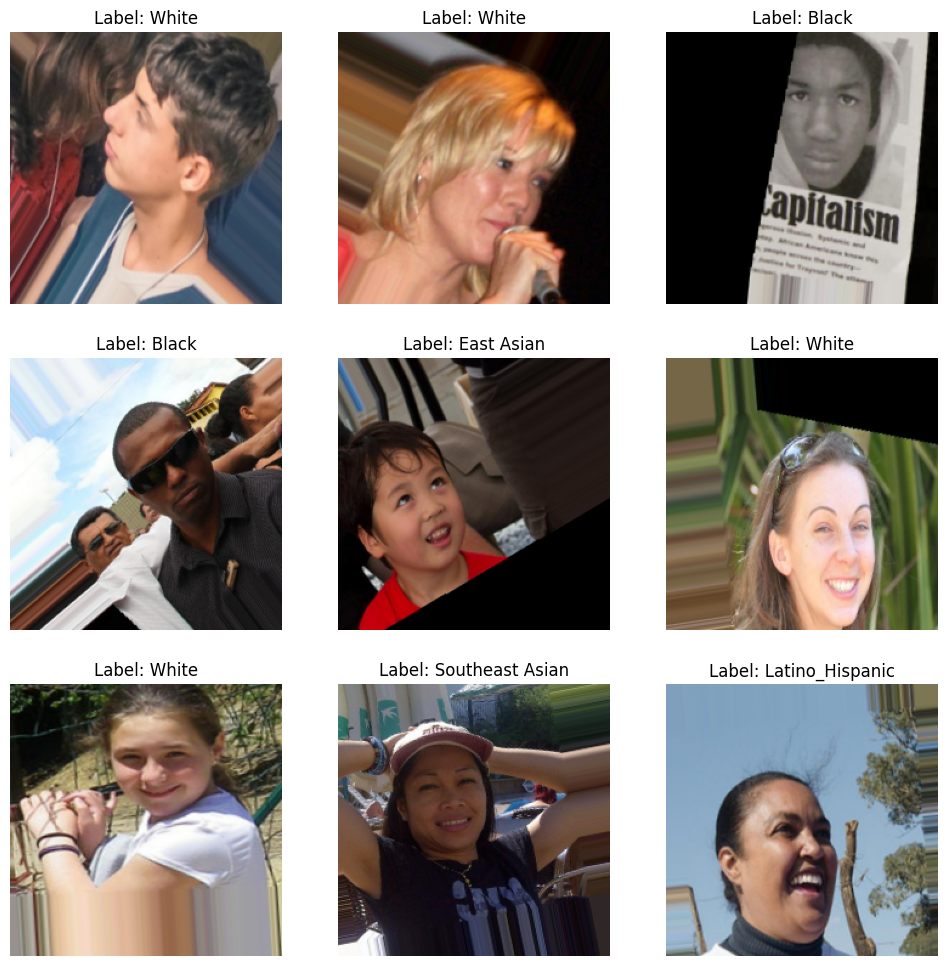

In [9]:
import matplotlib.pyplot as plt

# Get a batch of images and labels
images, labels = next(iter(train_generator))

# Class names
class_names = ['Black', 'East Asian', 'Indian', 'Latino_Hispanic', 'Middle Eastern', 'Southeast Asian', 'White']

# Plot a few images with their labels
plt.figure(figsize=(12, 12))
for i in range(9):  # Display 9 images
    plt.subplot(3, 3, i+1)
    # Rescale back to [0, 255] for proper display
    plt.imshow((images[i] * 255).astype("uint8"))
    label_index = labels[i].argmax()  # Get the index of the class with the highest value
    plt.title(f"Label: {class_names[label_index]}")
    plt.axis('off')  # Hide axes
plt.show()

In [10]:
# Get one batch of images and labels
images, labels = next(iter(train_generator))

# Check the min and max pixel values of the images
print("Min pixel value:", images.min())
print("Max pixel value:", images.max())

Min pixel value: 0.0
Max pixel value: 1.0


### Loading the Pre-Trained Base Model and Fine Tuning it

In [11]:
# Define the model using InceptionV3 as the base model
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [12]:
#Unfreeze the last few layers for fine-tuning
base_model.trainable = True

# Freeze all layers except the last 20
for layer in base_model.layers[:-20]:
    layer.trainable = False

### Custom Fully connected layer




In [13]:
## Add custom layers on top of the base model
last_output = base_model.output
x = GlobalAveragePooling2D()(last_output)

x = Dense(1024, activation='relu')(x)
x = Dense(7, activation='softmax')(x)

# Define the final model
# model = Model(inputs=base_model.input, outputs=x)

In [14]:
# Compile the 
model = Model(inputs=base_model.input, outputs=x)  # your model creation function
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [15]:
# Set up EarlyStopping callback to prevent overfitting
early_stop = EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True)

### Model Training

In [16]:
# Train the model
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=20,
    callbacks=[early_stop],
    verbose=1
)

Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2711/2711 ━━━━━━━━━━━━━━━━━━━━ 1813s 660ms/step - accuracy: 0.3765 - loss: 1.6379 - val_accuracy: 0.4593 - val_loss: 1.4363
Epoch 2/20
2711/2711 ━━━━━━━━━━━━━━━━━━━━ 1218s 448ms/step - accuracy: 0.4396 - loss: 1.4654 - val_accuracy: 0.4759 - val_loss: 1.3810
Epoch 3/20
2711/2711 ━━━━━━━━━━━━━━━━━━━━ 1117s 411ms/step - accuracy: 0.4568 - loss: 1.4309 - val_accuracy: 0.4789 - val_loss: 1.3755
Epoch 4/20
2711/2711 ━━━━━━━━━━━━━━━━━━━━ 1136s 418ms/step - accuracy: 0.4684 - loss: 1.3988 - val_accuracy: 0.4843 - val_loss: 1.3696
Epoch 5/20
2711/2711 ━━━━━━━━━━━━━━━━━━━━ 1134s 417ms/step - accuracy: 0.4745 - loss: 1.3773 - val_accuracy: 0.4857 - val_loss: 1.3600
Epoch 6/20
2711/2711 ━━━━━━━━━━━━━━━━━━━━ 1134s 417ms/step - accuracy: 0.4885 - loss: 1.3494 - val_accuracy: 0.4956 - val_loss: 1.3324
Epoch 7/20
2711/2711 ━━━━━━━━━━━━━━━━━━━━ 1113s 409ms/step - accuracy: 0.4867 - loss: 1.3483 - val_accuracy: 0.4892 - val_loss: 1.3796
Epoch 8/20
2711/2711 ━━━━━━━━━━━━━━━━━━━━ 1073s 395ms/step - accur

### Visauls on accuracy and loss 

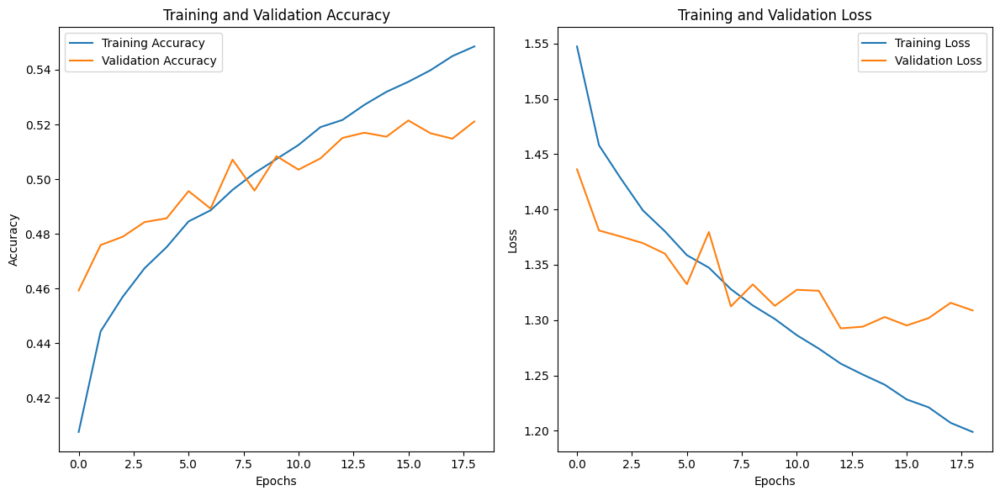

In [17]:
# Plot training & validation accuracy
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot training & validation loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Show the plots
plt.tight_layout()
plt.show()


In [21]:
# Save the trained model
model.save("/kaggle/working/fine_tuned_InceptionV3_model.h5")


###  Making Predicitons

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

def predict_image_class(model, img_path, class_names):
    """
    Predicts the class of an image using a trained model.

    Parameters:
    - model: Trained Keras model
    - img_path: Path to the image file
    - class_names: List of class labels

    Returns:
    - Predicted class name
    - Display the image with its prediction
    """
    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(224, 224))  # Resize image to match model's input size
    img_array = image.img_to_array(img)  # Convert image to array
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array /= 255.0  # Normalize the image (since we rescaled the training data)

    # Make predictions
    predictions = model.predict(img_array)
    predicted_class = np.argmax(predictions, axis=1)  # Get the index of the highest probability

    # Print predicted class
    predicted_class_name = class_names[predicted_class[0]]
    print(f"Predicted class: {predicted_class_name}")

    # Rescale the image for display (multiply by 255 to get the pixel values in [0, 255])
    img_display = img_array[0] * 255  # Rescale pixel values
    img_display = img_display.astype("uint8")  # Convert to uint8 for display

    # Display the image and the prediction
    plt.imshow(img_display)
    plt.title(f"Predicted: {predicted_class_name}")
    plt.axis('off')  # Hide axes
    plt.show()

    return predicted_class_name


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
Predicted class: White


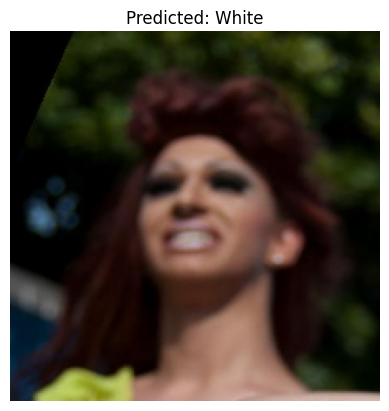

'White'

In [28]:
# Example usage:
class_names = ['Black', 'East Asian', 'Indian', 'Latino_Hispanic', 'Middle Eastern', 'Southeast Asian', 'White']  #  class names
img_path = "/kaggle/input/fairface-race/FairFace Race/val/White/3012.jpg" # path of the image 

# Call the function
predicted_class = predict_image_class(model, img_path, class_names)
predicted_class